In [1]:
import sqlite3
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.font_manager
import numpy as np

# create a database connection to the SQLite database specified by db_file
def create_connection(db_file):
    conn = None
    try:
        conn = sqlite3.connect(db_file)
        return conn
    except Error as e:
        print(e)
 
    return conn

In [2]:
# create the connection
conn = create_connection("./R_UMD.db")

# make dataframes from each table in the SQLite database
df_user = pd.read_sql("SELECT * FROM User", conn)
df_user_sub = pd.read_sql("SELECT * FROM UserSubreddits", conn)
df_post = pd.read_sql("SELECT * FROM Post", conn)
df_comment = pd.read_sql("SELECT * FROM Comment", conn)

# close connection -- no longer needed
conn.close()

In [3]:
# try and find all bots (usernames end with 'bot')
df_bot = df_user_sub[df_user_sub['name'].str.endswith("bot")]
gb = df_bot.groupby('name')    
gb = [gb.get_group(x) for x in gb.groups]

# remove any row from df_user_sub if it's from a bot
for name in gb :
    df_user_sub = df_user_sub[df_user_sub.name != str(name['name'].reset_index(drop=True)[0])]

In [52]:
conn = create_connection("./R_UMD.db")

df_startend = pd.read_sql(
    """SELECT name, 
    MIN(mn) as firstUTC, MAX(mx) as lastUTC, 
    MAX(mx) - MIN(mn) as durationUTC,
    DATETIME(MIN(mn), 'unixepoch') as firstDate, 
    DATETIME(MAX(mx), 'unixepoch') as lastDate, 
    JulianDay(DATETIME(MAX(mx), 'unixepoch')) - JulianDay(DATETIME(MIN(mn), 'unixepoch')) as durationDays FROM (
        SELECT name, MIN(created_utc) as mn, MAX(created_utc) as mx FROM Post GROUP BY name
        UNION
        SELECT name, MIN(created_utc) as mn, MAX(created_utc) as mx FROM Comment GROUP BY name
    ) t1 GROUP BY name ORDER BY durationDays DESC""", 
    conn
)

conn.close()

df_startend.head()

,name,firstUTC,lastUTC,durationUTC,firstDate,lastDate,durationDays
0,None,1.277515e+09,1.574025e+09,296510487.0,2010-06-26 01:13:33,2019-11-17 21:15:00,3431.834340
1,chrisg90,1.277440e+09,1.568899e+09,291459074.0,2010-06-25 04:21:00,2019-09-19 13:12:14,3373.368912
2,Blue_5ive,1.279951e+09,1.570563e+09,290611801.0,2010-07-24 05:58:33,2019-10-08 19:28:34,3363.562512
3,Ares__,1.279777e+09,1.569695e+09,289917731.0,2010-07-22 05:44:03,2019-09-28 18:26:14,3355.529294
4,umd_charlzz,1.286715e+09,1.573569e+09,286854188.0,2010-10-10 12:45:30,2019-11-12 14:28:38,3320.071620


In [82]:
from datetime import timedelta
from math import log

secsInDay = 60*60*24;

#[timedelta(seconds=x["durationUTC"]) for i, x in df_startend.iterrows()]
print("All data:")
print(timedelta(seconds=df_startend["durationUTC"].mean()))
print(timedelta(seconds=df_startend["durationUTC"].median()))
print(timedelta(seconds=df_startend["durationUTC"].std()))
print("Single-posters removed")
print(timedelta(seconds=df_startend[df_startend["durationUTC"] > 0]["durationUTC"].mean()))
print(timedelta(seconds=df_startend[df_startend["durationUTC"] > 0]["durationUTC"].median()))
print(timedelta(seconds=df_startend[df_startend["durationUTC"] > 0]["durationUTC"].std()))
print("Single-day-posters removed")
print(timedelta(seconds=df_startend[df_startend["durationUTC"] > secsInDay]["durationUTC"].mean()))
print(timedelta(seconds=df_startend[df_startend["durationUTC"] > secsInDay]["durationUTC"].median()))
print(timedelta(seconds=df_startend[df_startend["durationUTC"] > secsInDay]["durationUTC"].std()))

import plotly.express as px
fig = px.histogram(
    x=[timedelta(seconds=s).days for s in df_startend[df_startend["durationUTC"] > secsInDay]["durationUTC"]]
)
fig.show()

All data:
242 days, 16:47:35.999267
1 day, 13:24:33
463 days, 8:59:34.014975
Single-posters removed
384 days, 20:26:39.087454
156 days, 0:45:31
534 days, 13:55:53.371681
Single-day-posters removed
473 days, 21:49:15.601063
277 days, 8:32:13
556 days, 13:38:45.542122


In [87]:
fig = px.histogram(
    x=[datetime.utcfromtimestamp(s).month for s in df_startend["firstUTC"]]
)
fig.show()

fig = px.histogram(
    x=[datetime.utcfromtimestamp(s).month for s in df_startend["lastUTC"]]
)
fig.show()

## Subreddit-wide time-series trends

Let's start by plotting histograms of post activity over time, and comment activity over time.

In [92]:
fig = px.histogram(
    x=[datetime.utcfromtimestamp(s) for s in df_post["created_utc"]]
)
fig.show()

fig2 = px.histogram(
    x=[datetime.utcfromtimestamp(s) for s in df_comment["created_utc"]]
)
fig2.show()

Pretty cool! You can definitely see the general upward trend of activity, as well as seasonal spikes. Hovering over the months, you can see that the dips are typically Jun, July, August, as well as Jan and Feb. This makes sense, as these are breaks in which students are not engaged with UMD on a day to day basis.

So what if we want to put numbers to these trends? I.e. how much less posts per month are there during breaks? Approximately how many more comments per month is there per year? In order to do this, we should fit a regression, predicting activity (measured by posts/comments per month) based on year and season.

The first thing we need to do is to restructure the data so that we have the posts/comments per month available.

In [260]:
# Don't mess up everybody else's code
df_commentActivity = df_comment.copy()
df_postActivity = df_post.copy()

# Currently, we only have timestamps. Create two new columns by converting those timestamps into dates,
# and retrieving the relevant information from those dates.
df_commentActivity["month"] = [datetime.utcfromtimestamp(s).strftime("%b") for s in df_comment["created_utc"]]
df_commentActivity["year"] = [datetime.utcfromtimestamp(s).year for s in df_comment["created_utc"]]
df_postActivity["month"] = [datetime.utcfromtimestamp(s).strftime("%b") for s in df_post["created_utc"]]
df_postActivity["year"] = [datetime.utcfromtimestamp(s).year for s in df_post["created_utc"]]

# By grouping by month and year, we can get a count for every month (e.g. Nov 2016, Dec 2016, Jan 2017, etc.)
df_commentActivity = \
    df_commentActivity.groupby(["year", "month"], as_index=False).size().reset_index().rename(columns={0: "count"})
df_postActivity = \
    df_postActivity.groupby(["year", "month"], as_index=False).size().reset_index().rename(columns={0: "count"})

# One might think that a good categorization of the months would be by season - Winter, Spring, etc.
# However, looking at the seasonal trends on the histogram, there doesn't seem to be a big distinction between
# fall and spring semesters, nor winter and summer breaks. Thus, we can split Break/Semester instead of season
seasonLookup = {
    "Jan": "Break",
    "Feb": "Semester",
    "Mar": "Semester",
    "Apr": "Semester",
    "May": "Semester",
    "Jun": "Break",
    "Jul": "Break",
    "Aug": "Break",
    "Sep": "Semester",
    "Oct": "Semester",
    "Nov": "Semester",
    "Dec": "Break"
}

# Create two new columns based on our lookup.
df_commentActivity["season"] = [seasonLookup[m] for m in df_commentActivity["month"]]
df_postActivity["season"] = [seasonLookup[m] for m in df_postActivity["month"]]

Now that the data's structured, we can now try to fit a regression. Initially, we have one response (count), and two predictors (year, and season). Let's try to fit it now.

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.742
Model:                            OLS   Adj. R-squared:                  0.737
Method:                 Least Squares   F-statistic:                     159.7
Date:                Wed, 11 Dec 2019   Prob (F-statistic):           2.15e-33
Time:                        18:29:58   Log-Likelihood:                -939.91
No. Observations:                 114   AIC:                             1886.
Df Residuals:                     111   BIC:                             1894.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept          -1.124e+06    6.4

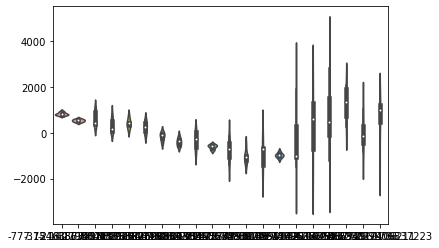

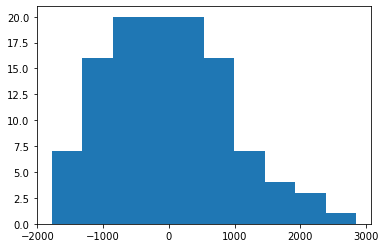

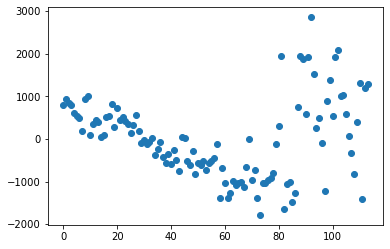

In [231]:
modelComment = smf.ols(formula='count ~ year+season', data=df_commentActivity).fit()
# Regression fit
print(modelComment.summary())

# Graphs to check assumptions of regression
plt.figure()
sns.violinplot(modelComment.fittedvalues, modelComment.resid)
plt.figure()
plt.hist(modelComment.resid)
plt.figure()
plt.scatter([i for i in range(len(modelComment.resid))], modelComment.resid)

### The five assumptions

Looking at just the p-values, it looks good. All of them are significantly below the 5% threshold. However, regression only works under five assumptions:

1. Linearity
2. Independence
3. Normality
4. Homoscedasticity
5. Non-collinearity

The violin graph is used to assess linearity, and homoscedasticity. For linearity, we are checking that each violin is centered around 0, and for homoscedasticity, we are checking that each violin is "roughly" the same size. Both of these clearly are violated due to many of the violins not being centered at 0, and wild variation in violin lengths.

The histogram is used to assess normality, and we are checking that the histogram follows a bell-curve. There is a right skew, and the curve is a little flat to be considered normal. Thus, normality is also violated.

The last scatter plots index vs residual, used to check independence, and we are checking if there is a pattern with regards to the obesrvations. There is a clear pattern - there is a clear downward trend until about the 80th observation.

Statsmodels has also given us a warning that multicollinearity may be an issue.

Oh no! We have scored a 0/5 in meeting the assumptions. In order for our model to give us usable numbers, we must attempt to meet all of these assumptions.

### Assumption 1: Linearity

The first assumption we should tackle is linearity. Linearity means that there is roughly a linear relationship between the predictors and the response. Because it was violated in our initial model, it seems that we may have a non-linear relationship between one of our predictors and count. This could make sense - it seems that as the years increase, the activity increases at a non-linear rate. We will try introducing an year^2 variable to our dataset to try and capture this non-linear relationship.

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.821
Model:                            OLS   Adj. R-squared:                  0.816
Method:                 Least Squares   F-statistic:                     168.1
Date:                Wed, 11 Dec 2019   Prob (F-statistic):           6.29e-41
Time:                        18:40:49   Log-Likelihood:                -919.12
No. Observations:                 114   AIC:                             1846.
Df Residuals:                     110   BIC:                             1857.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept           3.003e+08   4.33

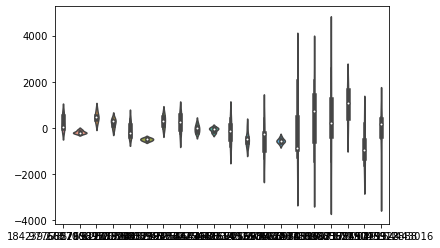

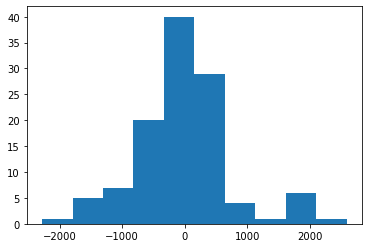

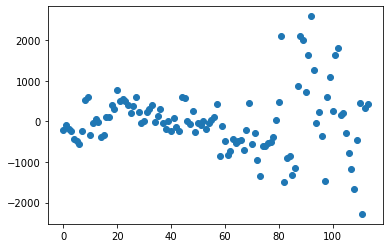

In [233]:
# The square function
square = lambda x: x**2

# add the year squared
modelComment = smf.ols(formula='count ~ year+square(year)+season', data=df_commentActivity).fit()
print(modelComment.summary())

plt.figure()
sns.violinplot(modelComment.fittedvalues, modelComment.resid)
plt.figure()
plt.hist(modelComment.resid)
plt.figure()
plt.scatter([i for i in range(len(modelComment.resid))], modelComment.resid)

That seemed to really help! The violins are more centered around 0, the histogram looks more like a bell curve, and we've eliminated the trend in the independence graph. However, the violins on the right are much bigger than the violins on the left - we will attempt to tackle this next.

### Assumption 2: Homoscedasticity
Homoscedascitisicity?? is a fancy word meaning "equal spread". When we check for this assumption, we are making sure that the variance in the residuals is roughly the same in all places. The residuals are errors - if the errors get increasingly larger as the predicted values get larger, then our model will have trouble accurately predicting for large y-values. Again, this is due to the non-linear trend in the data - we start with comments in the tens and hundreds and grow to thousands. Using a log transformation on the count variable will lessen the impact of how quickly the subreddit grew, and hopefully ensure the violins all are the same size.

                            OLS Regression Results                            
Dep. Variable:          np.log(count)   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                     138.3
Date:                Wed, 11 Dec 2019   Prob (F-statistic):           3.53e-37
Time:                        18:49:10   Log-Likelihood:                -92.026
No. Observations:                 114   AIC:                             192.1
Df Residuals:                     110   BIC:                             203.0
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept          -1.149e+05   3.06

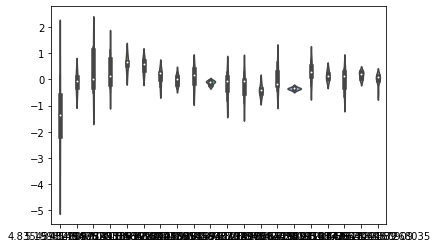

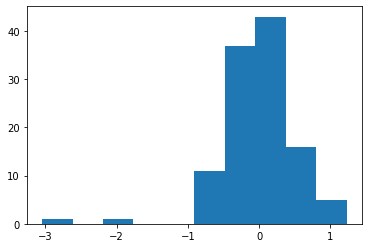

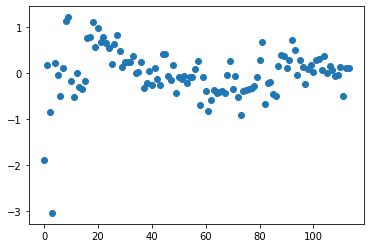

In [234]:
square = lambda x: x**2

# transform count into log(count)
modelComment = smf.ols(formula='np.log(count) ~ year+square(year)+season', data=df_commentActivity).fit()
print(modelComment.summary())

plt.figure()
sns.violinplot(modelComment.fittedvalues, modelComment.resid)
plt.figure()
plt.hist(modelComment.resid)
plt.figure()
plt.scatter([i for i in range(len(modelComment.resid))], modelComment.resid)

The transformation again did wonders for all three graphs - the violins (bar one) are now roughly the same size, our histogram (bar the skew) is normal, and the independence graph is looking better as well. In all three cases, there is one culprit: outliers.

### Assumption 3: Normality
The assumption of normality checks that the residuals (not the data!) follow a normal distribution. If the residuals are non-normal, such as right now, there will be a skew when estimating p-values. Our curve looks pretty decent, except for a few outliers giving it a right skew. In order to fix this, we will investigate the outliers and possibly remove them.

[year       2010
month       Aug
count        19
season    Break
Name: 0, dtype: object, year       2010
month       Jun
count         6
season    Break
Name: 3, dtype: object]
                            OLS Regression Results                            
Dep. Variable:          np.log(count)   R-squared:                       0.837
Model:                            OLS   Adj. R-squared:                  0.832
Method:                 Least Squares   F-statistic:                     184.9
Date:                Wed, 11 Dec 2019   Prob (F-statistic):           2.18e-42
Time:                        18:59:27   Log-Likelihood:                -57.807
No. Observations:                 112   AIC:                             123.6
Df Residuals:                     108   BIC:                             134.5
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                         coef    

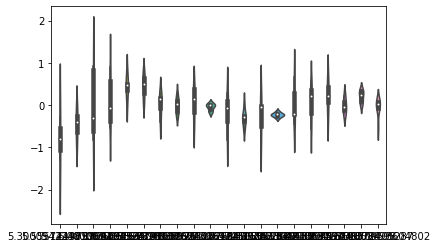

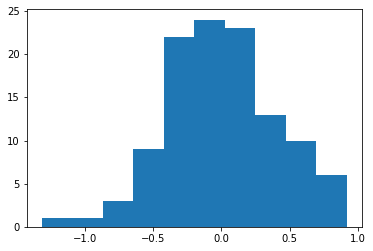

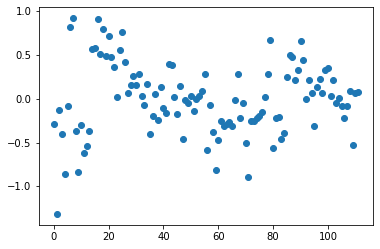

In [235]:
square = lambda x: x**2

# previous model
modelComment = smf.ols(formula='np.log(count) ~ year+square(year)+season', data=df_commentActivity).fit()

# test for outliers
test = modelComment.outlier_test()
outliers = [i for i,t in enumerate(test["bonf(p)"]) if t < 0.5]
# investigate outliers
print([df_commentActivity.iloc[i] for i in outliers])
# drop outliers
df_commentActivityNoOutliers = df_commentActivity.drop(outliers)

# Use model without outliers
modelComment2 = smf.ols(formula='np.log(count) ~ year+square(year)+season', data=df_commentActivityNoOutliers).fit()
print(modelComment2.summary())

plt.figure()
sns.violinplot(modelComment2.fittedvalues, modelComment2.resid)
plt.figure()
plt.hist(modelComment2.resid)
plt.figure()
plt.scatter([i for i in range(len(modelComment2.resid))], modelComment2.resid)

Investigating the outliers, it seems that they are from the inception of the subreddit. Because they differ from the other points in terms of their x-distance and their y-distance, they significantly affect the model and should be taken out. Because we have over 100 other observations, we should be fine

After successfully removing the outliers, the graphs are centered better. Now, we will tackle independence.

### Assumption 4: Independence

At first, the violin plot looks fine - all of the violins' centers fall between -1 and 1, and the spread for the most part is roughly the same throughout. However, looking at the centers of the violins, there is a certain up-and-down curvature, especially at the beginning. Looking at the scatter plot, this same curvature exists. There is still a slight pattern in our scatter plot, meaning the residuals are not independent with respect to time. In order to capture this relationship, we can add a lagged variable - meaning we can use the count of the previous month to predict the current month.

                            OLS Regression Results                            
Dep. Variable:          np.log(count)   R-squared:                       0.873
Model:                            OLS   Adj. R-squared:                  0.869
Method:                 Least Squares   F-statistic:                     182.9
Date:                Wed, 11 Dec 2019   Prob (F-statistic):           1.23e-46
Time:                        19:27:21   Log-Likelihood:                -42.670
No. Observations:                 111   AIC:                             95.34
Df Residuals:                     106   BIC:                             108.9
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept          -3.365e+04   2.16

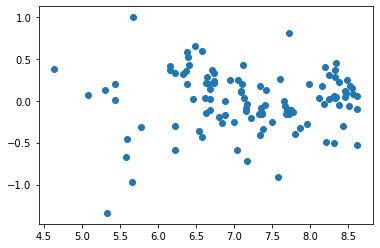

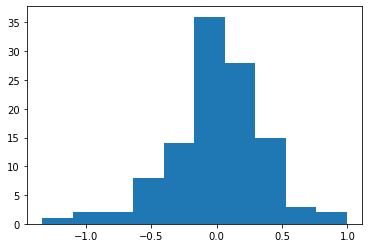

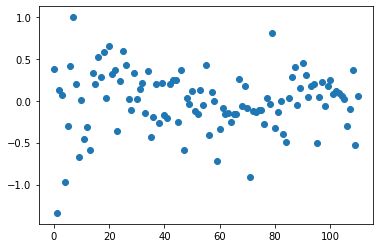

In [249]:
square = lambda x: x**2

modelComment = smf.ols(formula='np.log(count) ~ year+square(year)+season', data=df_commentActivity).fit()

test = modelComment.outlier_test()
outliers = [i for i,t in enumerate(test["bonf(p)"]) if t < 0.5]
df_commentActivityNoOutliers = df_commentActivity.drop(outliers)

df_commentActivityNoOutliersLagged = df_commentActivityNoOutliers.copy()
# Create lagged variable
df_commentActivityNoOutliersLagged["countLag"] = df_commentActivityNoOutliersLagged["count"].shift(-1)

modelComment2 = smf.ols(formula='np.log(count) ~ year+square(year)+season+np.log(countLag)', 
                       data=df_commentActivityNoOutliersLagged).fit()
print(modelComment2.summary())

plt.figure()
plt.scatter(modelComment2.fittedvalues, modelComment2.resid)
plt.figure()
plt.hist(modelComment2.resid)
plt.figure()
plt.scatter([i for i in range(len(modelComment2.resid))], modelComment2.resid)

Unfortunately, seaborn stopped working here so I used a scatter plot in place of the violin. The interpretation is the same - imagine splitting the dots horizontally into chunks - each chunk should have a mean of zero and a spread that is equal throughout. Save for a few minor outliers, the assumptions have almost been satsified. Now, let's get rid of that collinearity error.

### Assumption 5: Non-collinearity

This one is rather simple - year and square(year) have a strong collinearity because the latter is based on the former. We can center these variables by subtracting by their means - this will produce an equivalent model.

                            OLS Regression Results                            
Dep. Variable:          np.log(count)   R-squared:                       0.873
Model:                            OLS   Adj. R-squared:                  0.869
Method:                 Least Squares   F-statistic:                     182.9
Date:                Wed, 11 Dec 2019   Prob (F-statistic):           1.23e-46
Time:                        19:59:46   Log-Likelihood:                -42.670
No. Observations:                 111   AIC:                             95.34
Df Residuals:                     106   BIC:                             108.9
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                3.7752 

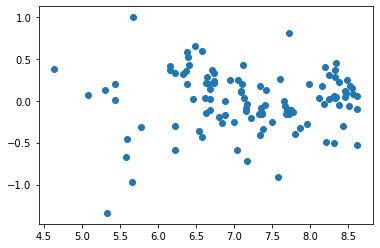

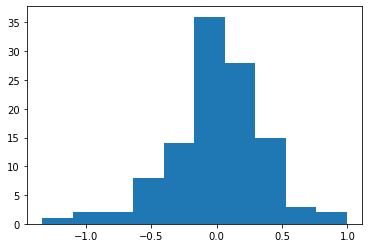

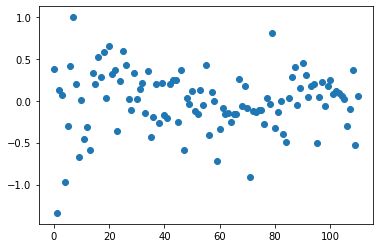

In [261]:
square = lambda x: x**2
# centering function
center = lambda x: x - x.mean()

modelComment = smf.ols(formula='np.log(count) ~ year+square(year)+season', data=df_commentActivity).fit()

test = modelComment.outlier_test()
outliers = [i for i,t in enumerate(test["bonf(p)"]) if t < 0.5]
df_commentActivityNoOutliers = df_commentActivity.drop(outliers)

df_commentActivityNoOutliersLagged = df_commentActivityNoOutliers.copy()
df_commentActivityNoOutliersLagged["countLag"] = df_commentActivityNoOutliersLagged["count"].shift(-1)

modelComment2 = smf.ols(formula='np.log(count) ~ center(year)+square(center(year))+season+np.log(countLag)', 
                       data=df_commentActivityNoOutliersLagged).fit()
print(modelComment2.summary())

plt.figure()
plt.scatter(modelComment2.fittedvalues, modelComment2.resid)
plt.figure()
plt.hist(modelComment2.resid)
plt.figure()
plt.scatter([i for i in range(len(modelComment2.resid))], modelComment2.resid)

Ta-da! Our model should be ready for interpretation. However, along the way, our season and year^2 variables have become statistically insignificant. However, season still definitely has an effect on the activity per month. The issue is probably that we have defined season too widely - perhaps it will become statistically significant if we narrow it to summer break only.

                            OLS Regression Results                            
Dep. Variable:          np.log(count)   R-squared:                       0.879
Model:                            OLS   Adj. R-squared:                  0.875
Method:                 Least Squares   F-statistic:                     258.3
Date:                Wed, 11 Dec 2019   Prob (F-statistic):           7.67e-49
Time:                        20:17:32   Log-Likelihood:                -40.343
No. Observations:                 111   AIC:                             88.69
Df Residuals:                     107   BIC:                             99.52
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            3.7278      0.557  

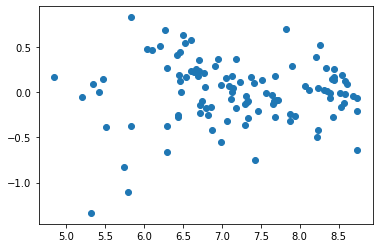

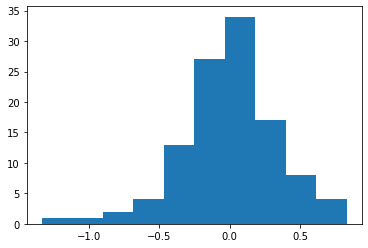

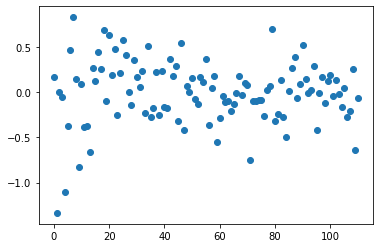

In [270]:
# Redefine "season" to be only summer break
df_commentActivity["summer"] = [True if m in ["Jun", "Jul", "Aug"] else False for m in df_commentActivity["month"]]

square = lambda x: x**2
center = lambda x: x - x.mean()

modelComment = smf.ols(formula='np.log(count) ~ year+square(year)+summer', data=df_commentActivity).fit()

test = modelComment.outlier_test()
outliers = [i for i,t in enumerate(test["bonf(p)"]) if t < 0.5]
df_commentActivityNoOutliers = df_commentActivity.drop(outliers)

df_commentActivityNoOutliersLagged = df_commentActivityNoOutliers.copy()
df_commentActivityNoOutliersLagged["countLag"] = df_commentActivityNoOutliersLagged["count"].shift(-1)

# Remove year^2 and fit summer instead of season
modelComment2 = smf.ols(formula='np.log(count) ~ center(year)+summer+np.log(countLag)', 
                       data=df_commentActivityNoOutliersLagged).fit()
print(modelComment2.summary())

plt.figure()
plt.scatter(modelComment2.fittedvalues, modelComment2.resid)
plt.figure()
plt.hist(modelComment2.resid)
plt.figure()
plt.scatter([i for i in range(len(modelComment2.resid))], modelComment2.resid)

Viola! There is our final model, with all assumptions satisfied and all variables signficant. We can now interpret the coefficients:

* During summer break, the number of comments on average will decrease by (1 - e<sup>-0.2366</sup>)%, or 21%, given all other variables are constant.
* With an increase of one year, the number of comments on average will increase by (e<sup>0.1754</sup> - 1)%, or 19%, given all other variables are constant.
* On average, every 1% increase in the previous months' comments leads to a (e<sup>0.4904</sup> - 1)%, or 0.63% increase in the current months' comments, given all other variables are constant.

In [287]:
df_postActivity["summer"] = [True if m in ["Jun", "Jul", "Aug"] else False for m in df_postActivity["month"]]

square = lambda x: x**2
center = lambda x: x - x.mean()

modelPost = smf.ols(formula='np.log(count) ~ year+square(year)+summer', data=df_postActivity).fit()

test = modelPost.outlier_test()
outliers = [i for i,t in enumerate(test["bonf(p)"]) if t < 0.5]
df_postActivityNoOutliers = df_postActivity.drop(outliers)

df_postActivityNoOutliersLagged = df_postActivityNoOutliers.copy()
df_postActivityNoOutliersLagged["countLag"] = df_postActivityNoOutliersLagged["count"].shift(-1)

# Remove year^2 and fit summer instead of season
modelPost2 = smf.ols(formula='np.log(count) ~ center(year)+summer+np.log(countLag)', 
                       data=df_postActivityNoOutliersLagged).fit()
print(modelPost2.summary())

                            OLS Regression Results                            
Dep. Variable:          np.log(count)   R-squared:                       0.909
Model:                            OLS   Adj. R-squared:                  0.907
Method:                 Least Squares   F-statistic:                     357.3
Date:                Wed, 11 Dec 2019   Prob (F-statistic):           1.40e-55
Time:                        21:02:13   Log-Likelihood:                -34.107
No. Observations:                 111   AIC:                             76.21
Df Residuals:                     107   BIC:                             87.05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            2.8961      0.398  

We can easily do the same for posts:

* During summer break, the number of posts on average will decrease by (1 - e<sup>-0.3125</sup>)%, or 27%, given all other variables are constant.
* With an increase of one year, the number of posts on average will increase by (e<sup>0.1988</sup> - 1)%, or 22%, given all other variables are constant.
* On average, every 1% increase in the previous months' posts leads to a (e<sup>0.4823</sup> - 1)%, or 0.62% increase in the current months' posts, given all other variables are constant.

In [282]:
df_commentDay = df_comment.copy()
df_postDay = df_post.copy()

df_commentDay["month"] = [datetime.utcfromtimestamp(s).strftime("%b") for s in df_comment["created_utc"]]
df_commentDay["year"] = [datetime.utcfromtimestamp(s).year for s in df_comment["created_utc"]]
df_commentDay["day"] = [datetime.utcfromtimestamp(s).day for s in df_comment["created_utc"]]
df_postDay["month"] = [datetime.utcfromtimestamp(s).strftime("%b") for s in df_post["created_utc"]]
df_postDay["year"] = [datetime.utcfromtimestamp(s).year for s in df_post["created_utc"]]
df_postDay["day"] = [datetime.utcfromtimestamp(s).day for s in df_post["created_utc"]]

df_commentDayGroup = \
    df_commentDay.groupby(["year", "month", "day"], as_index=False).size().reset_index().rename(columns={0: "count"})
df_postDayGroup = \
    df_postDay.groupby(["year", "month", "day"], as_index=False).size().reset_index().rename(columns={0: "count"})

In [286]:
#print(df_postDay.sort_values("count", ascending=False))
#print(df_commentDay.sort_values("count", ascending=False))

df_postDay[(df_postDay["month"] == "Nov") & (df_postDay["year"] == 2019) & (df_postDay["day"] == 5)]

,id,name,url,title,selftext,score,created_utc,permalink,link_flair_text,month,year,day
476,ds7kf9,umdtortuga,https://www.reddit.com/r/UMD/comments/ds7kf9/s...,Seasonal Jobs During Winter Break?,I am staying in CP over winter break and I was...,6,1.572997e+09,/r/UMD/comments/ds7kf9/seasonal_jobs_during_wi...,Help,Nov,2019,5
477,ds7jot,NEMM2020,https://i.redd.it/ytgkwxkisww31.png,UMD didn't make the cut. UMBC did.,,17,1.572997e+09,/r/UMD/comments/ds7jot/umd_didnt_make_the_cut_...,Athletics,Nov,2019,5
478,ds7dyv,Bitshiftee,https://www.reddit.com/r/UMD/comments/ds7dyv/w...,Who’s the better instructor between Vibha Saza...,I know nobody here has taken their 420 classes...,6,1.572996e+09,/r/UMD/comments/ds7dyv/whos_the_better_instruc...,Discussion,Nov,2019,5
479,ds74n8,DreamyGenie,https://www.reddit.com/r/UMD/comments/ds74n8/i...,"If you lost your Fitbit in the cs building, I ...",I’ll turn it in tomorrow cause idk where the l...,3,1.572995e+09,/r/UMD/comments/ds74n8/if_you_lost_your_fitbit...,None,Nov,2019,5
480,ds73w0,Balderdasheries,https://www.reddit.com/r/UMD/comments/ds73w0/w...,What’s the best way to self-study the content ...,I think the material is interesting and useful...,3,1.572995e+09,/r/UMD/comments/ds73w0/whats_the_best_way_to_s...,Academic,Nov,2019,5
481,ds6yzt,hopt28,https://www.reddit.com/r/UMD/comments/ds6yzt/a...,Anyone want a ticket for tonights game?,Message for it. Can't go so I'm giving away.,1,1.572994e+09,/r/UMD/comments/ds6yzt/anyone_want_a_ticket_fo...,Athletics,Nov,2019,5
482,ds6ot5,Dngrous,https://www.reddit.com/r/UMD/comments/ds6ot5/w...,Why are the Wraps from little cafe in Mckeldin...,Is this pure laziness or am I missing somethin...,1,1.572993e+09,/r/UMD/comments/ds6ot5/why_are_the_wraps_from_...,Discussion,Nov,2019,5
483,ds6iah,iribewhat,https://www.reddit.com/r/UMD/comments/ds6iah/i...,If Eduroam was a person,What would you say/do to them?,6,1.572992e+09,/r/UMD/comments/ds6iah/if_eduroam_was_a_person/,None,Nov,2019,5
484,ds6aqo,NutMAIN,https://www.reddit.com/r/UMD/comments/ds6aqo/c...,Considering coming to umd,"How is it at Maryland, how’s campus etc, I liv...",2,1.572991e+09,/r/UMD/comments/ds6aqo/considering_coming_to_umd/,Discussion,Nov,2019,5
485,ds66mm,Pappsee,https://www.reddit.com/r/UMD/comments/ds66mm/n...,Need help with video editing,Is there anyone in here who's good with video ...,1,1.572991e+09,/r/UMD/comments/ds66mm/need_help_with_video_ed...,Academic,Nov,2019,5
